In [13]:
ROOT_DIR = "/home/user/Documents/projects/Metaworld"
%env MUJOCO_GL=egl

import sys
sys.path.append(ROOT_DIR)

import os
import functools
import json
from tqdm import tqdm
import importlib
from dataclasses import dataclass

# scientific
import cv2
import numpy as np
import torch
import pytorch_lightning as pl

# gym
# from gym.spaces import Box
import mujoco
import metaworld
from metaworld import MT1

# plotting
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d

# project imports
# from metaworld.envs.mujoco.sawyer_xyz.test_scripted_policies import ALL_ENVS, test_cases_latest_nonoise
# import reset_space
import utils.camera_utils_v2 as cu
import keyframes.env_utils as env_utils
import keyframes.env_renderer as env_renderer
import keyframes.mujoco_utils as mujoco_utils
import keyframes.keyframe_utils as keyframe_utils
import keyframes.pl_modules as pl_modules
import utils.predict_utils as keyframe_predict

import utils.slam_utils as slam_utils
import utils.depth_utils as depth_utils
import utils.match_utils as match_utils
import utils.transform_utils as transform_utils
import utils.inference_utils as inference_utils

import models.extern.mcc_model as mcc_model
import utils.mcc_misc_utils as mcc_misc_utils
import utils.mcc_data_utils as mcc_data_utils
import utils.predict_utils as predict_utils
import utils.vis_utils as vis_utils
import utils.plotly_utils as plotly_utils
from pytorch3d.io.obj_io import load_obj
import utils.torch_utils as torch_utils

import keyframes.estimators.push_pose_estimator as push_pose_estimator

import keyframes.seg_any as seg_any
import keyframes.mcc as mcc


DEVICE = "cuda"


env: MUJOCO_GL=egl


TODO how to determine whether push or pull? => check non moving kpts

1) SegAny
2) MCC Reconstruct
3) Find normals

In [14]:
img_shape = (360, 480)
device = DEVICE

# model cktps
model_ckpts_dir = "/home/user/Documents/model_ckpts/"
fts_match_ckpt_path = f"{model_ckpts_dir}/lightglue_epoch=34-step=3885.ckpt"
seg_any_ckpt_path = f"{model_ckpts_dir}/sam_vit_h_4b8939.pth"
mcc_ckpt_path = f"{model_ckpts_dir}/co3dv2_all_categories.pth"

# load models

# load feature extractor
model_fts_extract = slam_utils.get_super_glue_extractor(device=DEVICE)

# load feature matching model
config = inference_utils.load_config("feature_matching", "01", ROOT_DIR=ROOT_DIR)
model_fts_match = pl_modules.PLModel(config["model_args"], config["optimizer_args"])
model_fts_match = model_fts_match.load_from_checkpoint(fts_match_ckpt_path)
model_fts_match.to(DEVICE)
model_fts_match.eval();

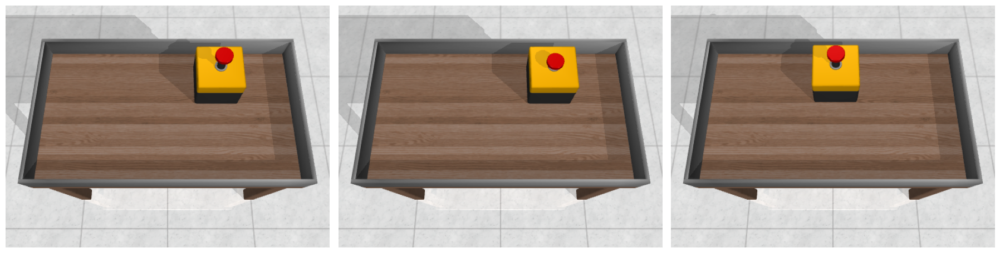

In [19]:
# reference keyframes env

# param
env_index = 4
img_height, img_width = 360, 480

# generate env and renderer
env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width, camera_name="keyframes")
T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
T_pixel2world = np.linalg.inv(T_world2pixel)


# generate keyframes
keyframe_data = keyframe_utils.generate_keyframes(env, renderer)

img_ref_0 = keyframe_data["img"][0]
img_ref_1 = keyframe_data["img"][1]
depth_ref_0 = keyframe_data["depth"][0]
depth_ref_1 = keyframe_data["depth"][1]

# generate keyframe of current env
img_cur, depth_cur = keyframe_utils.generate_cur_keyframe(env, renderer)

viz2d.plot_images([img_ref_0, img_ref_1, img_cur])

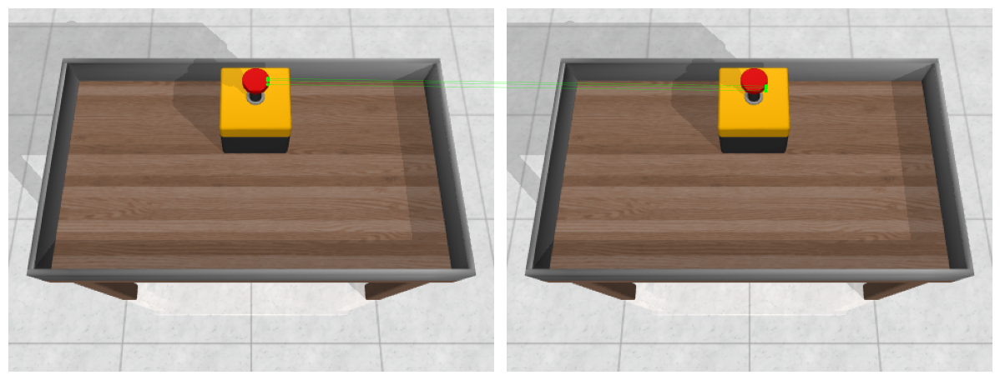

In [20]:
ref_data = inference_utils.compute_matches(model_fts_extract, model_fts_match, img_ref_0, img_ref_1, depth_ref_0, depth_ref_1, T_pixel2world)
pred_res = inference_utils.predict_feature_movement_from_ref_data(model_fts_extract, model_fts_match, T_world2pixel, img_cur, depth_cur, ref_data)
inference_utils.show_matches_kpts(img_cur, img_cur, pred_res["kpts"]["kpts_2_0"], pred_res["kpts"]["kpts_2_1"])

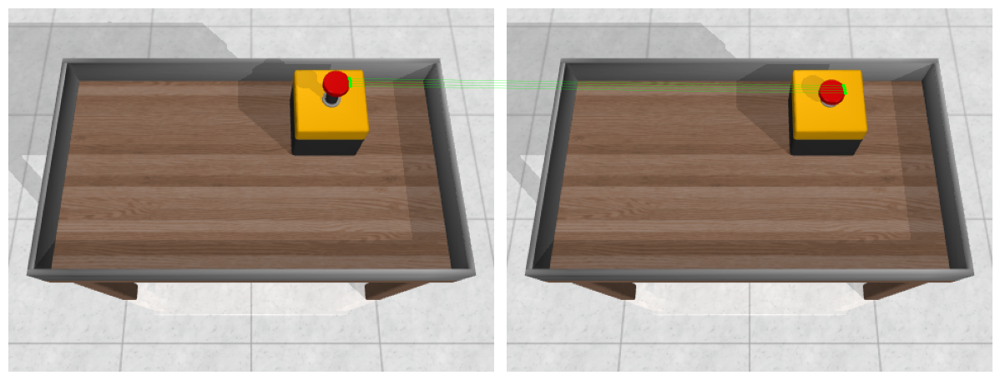

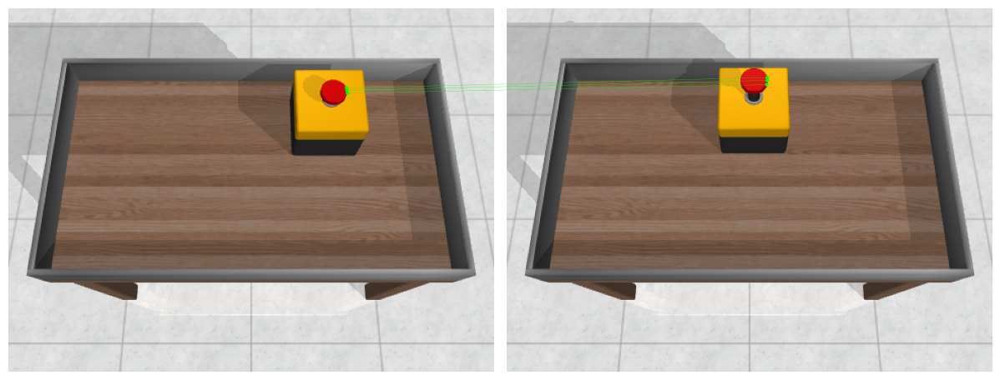

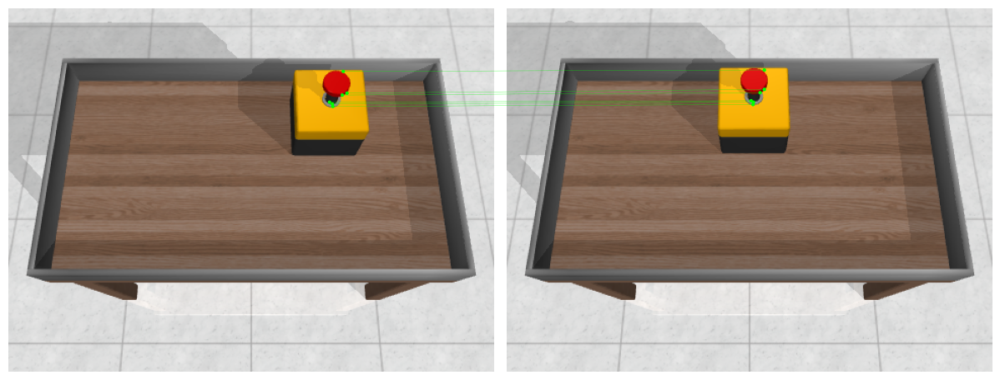

In [21]:
inference_utils.visualize_keypoint_mapping(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], pred_res["debug"]["m_moving_0_0_to_0_1"])
inference_utils.visualize_keypoint_mapping(img_ref_1, img_cur, ref_data["kpts_1"], pred_res["debug"]["kpts_cur"], pred_res["debug"]["m_moving_0_1_to_1_1"])
inference_utils.visualize_keypoint_mapping(img_ref_0, img_cur, ref_data["kpts_0"], pred_res["debug"]["kpts_cur"], pred_res["debug"]["m_closest_1_0_to_1_1"])

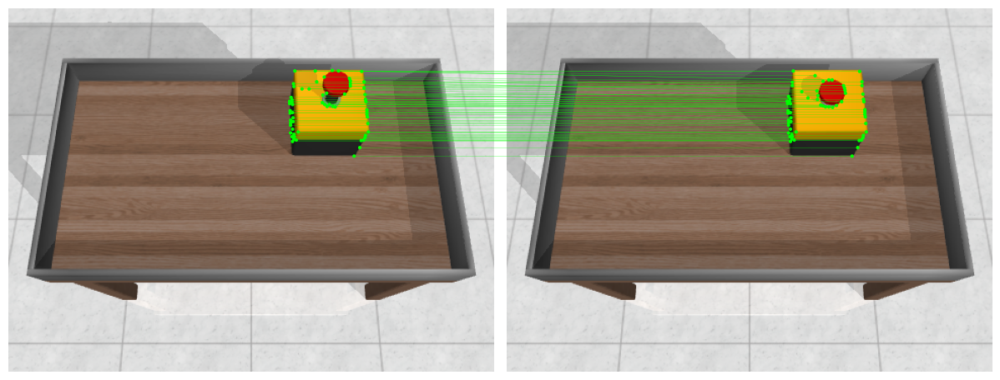

In [22]:
inference_utils.visualize_keypoint_matches_0(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], ref_data["matches_0"])

## Estimate Push Pose

In [23]:
# load seg any
seg_any_estimator = seg_any.SegAny(
    ckpt_path=seg_any_ckpt_path,
    img_shape=img_shape,
)

# load mcc
mcc_reconstructor = mcc.ReconstructMCC(
    mcc_ckpt_path=mcc_ckpt_path,
    device=device,
)

Resume checkpoint /home/user/Documents/model_ckpts//co3dv2_all_categories.pth
_IncompatibleKeys(missing_keys=[], unexpected_keys=['mask_token'])


In [26]:
# input data
img: np.ndarray = img_cur
kpts = pred_res["kpts"]["kpts_2_0"]
xyz = depth_utils.pixel_coords_to_world_coords(
    T_pixel2world, 
    depth_cur,
)[:,:3]

In [27]:

step_data = {}
mcc_params = {"grid_granularity": 0.025}

# 1) get seg mask
step_data["seg"] = seg_any_estimator.compute_mask(img, kpts)

# 2) reconstruct
mcc_reconstructor.set_model_input(
    img,
    step_data["seg"],
    xyz,
    grid_granularity=mcc_params["grid_granularity"],
)
(
    step_data["pred_occupy"],
    step_data["pred_colors"],
    step_data["occupy_threshold"],
    step_data["verts"],
    step_data["faces"],
    step_data["vert_normals"],
    step_data["values"],
) = mcc_reconstructor.reconstruct()


100%|██████████| 256/256 [00:56<00:00,  4.52it/s]


torch.Size([560, 3])


100%|██████████| 1/1 [00:00<00:00, 12.92it/s]


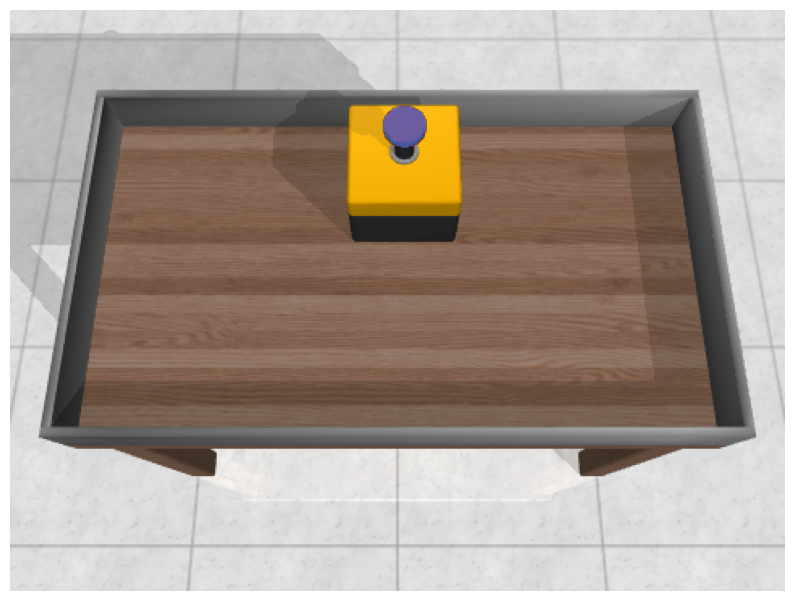

In [28]:
vis_utils.show_image_with_mask(img_cur, step_data["seg"])

In [29]:
plotly_utils.plot_mesh(step_data["verts"], step_data["faces"])

In [39]:
importlib.reload(push_pose_estimator)

<module 'keyframes.estimators.push_pose_estimator' from '/home/user/Documents/projects/Metaworld/keyframes/estimators/push_pose_estimator.py'>

In [37]:
occupy_threshold = step_data["occupy_threshold"]

def is_occupied(query_points: np.ndarray):
    query_points_normalized = mcc_reconstructor.normalize(query_points)
    query_points_normalized = torch_utils.to_torch(query_points_normalized, device)
    pred_occupied, _ = mcc_reconstructor.query_model(query_points_normalized)
    pred_occupied = torch_utils.to_numpy(pred_occupied)
    return pred_occupied > occupy_threshold

In [63]:
import utils.geom_utils as geom_utils

In [73]:
verts_world = mcc_reconstructor.denormalize(step_data["verts"])
surface_vert_normals = -step_data["vert_normals"]  # normals are inverted
push_vector = np.mean(pred_res["kpts"]["wpos_kpts_2_1"] - pred_res["kpts"]["wpos_kpts_2_0"], axis=0)[:3]
push_direction = push_vector / np.linalg.norm(push_vector)
possible_push_vectors = np.concatenate([np.eye(3), -np.eye(3)], axis=0)
angles = geom_utils.calculate_angle(possible_push_vectors, push_direction)
push_direction = possible_push_vectors[np.argmin(angles)]
push_vector = np.dot(push_direction, push_vector) * push_direction

In [69]:
importlib.reload(push_pose_estimator)

<module 'keyframes.estimators.push_pose_estimator' from '/home/user/Documents/projects/Metaworld/keyframes/estimators/push_pose_estimator.py'>

In [71]:
verts_world.shape

(10678, 3)

In [75]:
potential_push_positions = push_pose_estimator.generate_potential_push_poses_for_surface(
    verts_world,
    surface_vert_normals,
    is_occupied,
    push_direction=push_direction
)
push_position = push_pose_estimator.select_best_push_pos(verts_world, potential_push_positions, push_direction)

100%|██████████| 211/211 [00:46<00:00,  4.55it/s]


In [76]:
plotly_utils.plot_scatter([xyz, np.vstack([push_position, push_position + push_vector]), pred_res["kpts"]["wpos_kpts_2_0"], pred_res["kpts"]["wpos_kpts_2_1"]], sizes=[2, 6, 2, 2], colors=["grey", "green", "red", "blue"])

In [32]:
push_direction.shape

(4,)

In [ ]:
elif step == 2:
    (
        self.step_data["verts_1_new"],
        self.step_data["verts_2_new"],
        self.step_data["verts_1"],
        self.step_data["verts_2"],
        self.step_data["v1_to_v2"],
    ) = self._generate_potential_grasp_points(
        self.step_data["verts"],
        self.step_data["vert_normals"],
        occupy_threshold=self.step_data["occupy_threshold"],
        scale=1 / self.mcc_reconstructor.masked_max_dist,
    )
elif step == 3:
    self.step_data["grasp_point"] = self._compute_grasp_point(
        self.step_data["verts_1_new"], self.step_data["verts_2_new"]
    )
return self.step_data